In [1]:
!pip install tensorflow tensorflow-datasets polymahalanobis tqdm
!pip install "numpy<2.0" --quiet

DEPRECATION: Loading egg at /opt/conda/envs/dl/lib/python3.11/site-packages/paddleseg-0.0.0.dev0-py3.11.egg is deprecated. pip 25.1 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.4/572.4 MB 33.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 45.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 46.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 44.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 48.1 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.9/16.9 MB 49.3 MB/s eta 0:00:00a 0:00:01
  Created wheel for promise: filename=promise-2.3-py3-none-any.whl size=21483 sha256=b98f3cfb6e24ee846b8e3eb988b80984319bd2790f9c7eda2db878f33ab9ff64
  Stored in 

I0000 00:00:1788612161.690094     346 port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
I0000 00:00:1788612161.746589     346 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX512_FP16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
I0000 00:00:1788612162.957751     346 port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
I0000 00:00:1788612170.414398     214 gpu_device.cc:2043] Creat

Dataset colorectal_histology downloaded and prepared to /root/tensorflow_datasets/colorectal_histology/2.0.0. Subsequent calls will reuse this data.


I0000 00:00:1788612197.824256    1115 tf_record_dataset_op.cc:396] The default buffer size is 262144, which is overridden by the user specified `buffer_size` of 8388608


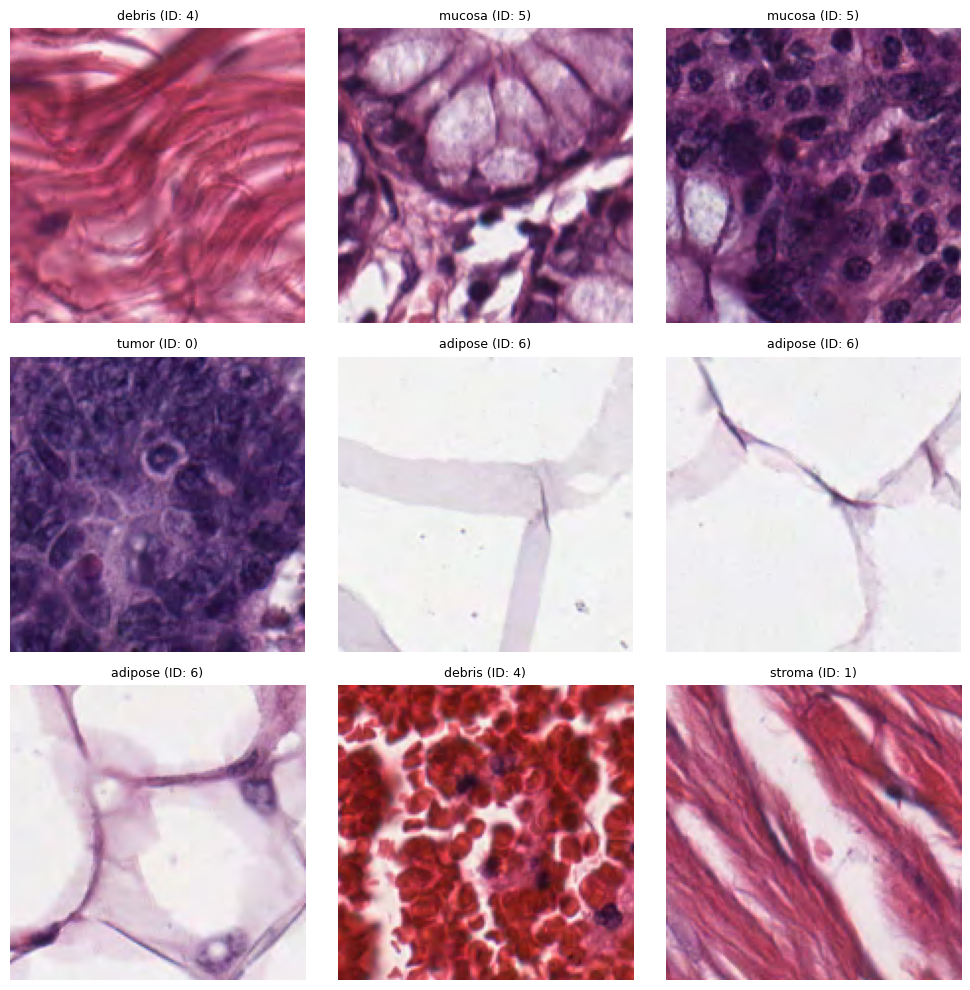

In [2]:
import os
# os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Silencia logs informativos do TensorFlow
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt

# Desativa barras de progresso verbosas que estouram o IOPub
tfds.core.utils.tqdm_utils.disable_progress_bar()

# Carregamento com splits
(ds_train, ds_val, ds_test), ds_info = tfds.load(
    'colorectal_histology',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    as_supervised=True,
    with_info=True,
    shuffle_files=True
)

class_names = ds_info.features['label'].names

# Visualização de 9 amostras
plt.figure(figsize=(10, 10))
for i, (image, label) in enumerate(ds_train.take(9)):
    plt.subplot(3, 3, i + 1)
    plt.imshow(image.numpy())
    plt.title(f"{class_names[label.numpy()]} (ID: {label.numpy()})", fontsize=9)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [158]:
img = ds_train.take(1)
print(img.element_spec[0].shape)

kernels_by_row = 1
kernel_size = int(img.element_spec[0].shape[0]/kernels_by_row)
print(f'Kerne size: {kernel_size}px')


(150, 150, 3)
Kerne size: 150px


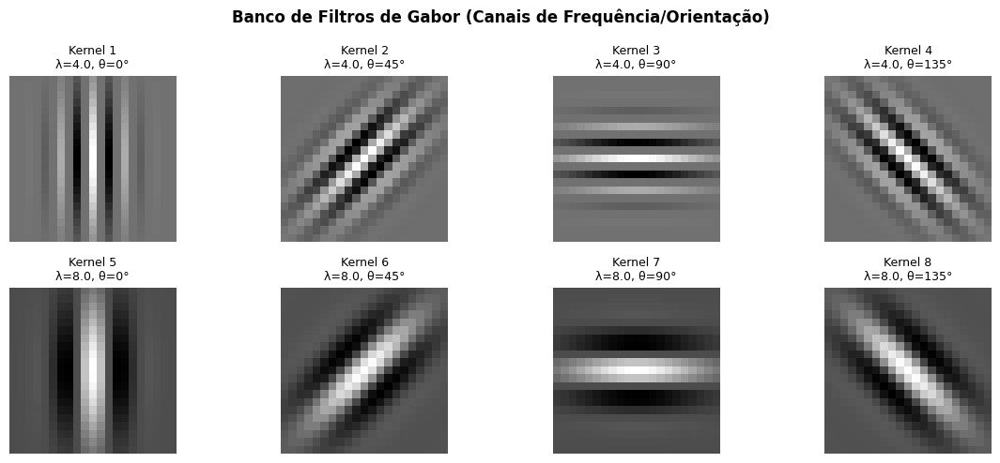

In [159]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from polymahalanobis import PolyMahalanobis
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

def create_gabor_bank(ksize=21, sigma=3.0, lambdas=[4.0, 8.0], thetas=[0, np.pi/4, np.pi/2, 3*np.pi/4], gamma=0.5):
    filters = []
    metadata = []
    for lam in lambdas:
        for theta in thetas:
            k_real = cv2.getGaborKernel((ksize, ksize), sigma, theta, lam, gamma, psi=0, ktype=cv2.CV_32F)
            k_imag = cv2.getGaborKernel((ksize, ksize), sigma, theta, lam, gamma, psi=np.pi/2, ktype=cv2.CV_32F)
            filters.append((k_real, k_imag))
            metadata.append(f"λ={lam}, θ={int(np.degrees(theta))}°")
    return filters, metadata

gabor_bank, gabor_meta = create_gabor_bank()

# Visualização do banco de filtros
fig, axes = plt.subplots(2, 4, figsize=(12, 5))
for i, ((k_real, _), meta) in enumerate(zip(gabor_bank, gabor_meta)):
    ax = axes[i // 4, i % 4]
    ax.imshow(k_real, cmap='gray')
    ax.set_title(f"Kernel {i+1}\n{meta}", fontsize=9)
    ax.axis('off')
plt.suptitle("Banco de Filtros de Gabor (Canais de Frequência/Orientação)", fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

In [160]:
from dataclasses import dataclass
from typing import List, Tuple
import cv2
import matplotlib.pyplot as plt
import numpy as np


# =====================================================================
# 1. PROCESSAMENTO EM NÍVEL DE IMAGEM COMPLETA
# =====================================================================


def _preprocess_image(img: np.ndarray) -> np.ndarray:
    """Garante array uint8 na escala [0, 255] para o OpenCV."""
    if hasattr(img, "numpy"):
        img = img.numpy()
    if img.dtype != np.uint8:
        return (
            (img * 255).astype(np.uint8)
            if img.max() <= 1.0
            else img.astype(np.uint8)
        )
    return img


def _compute_full_image_maps(
    image_np: np.ndarray, gabor_bank: List[Tuple[np.ndarray, np.ndarray]]
) -> Tuple[np.ndarray, np.ndarray, np.ndarray, List[np.ndarray]]:
    """Converte e aplica todos os filtros de Gabor na imagem inteira de uma só vez."""
    img_uint8 = _preprocess_image(image_np)

    gray = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2GRAY).astype(np.float32)
    lab = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2LAB).astype(np.float32)

    # Convoluções globais (evita artefato de borda de patches pequenos)
    energy_maps = []
    for k_real, k_imag in gabor_bank:
        f_real = cv2.filter2D(gray, cv2.CV_32F, k_real)
        f_imag = cv2.filter2D(gray, cv2.CV_32F, k_imag)
        energy_maps.append(cv2.magnitude(f_real, f_imag))

    return img_uint8, gray, lab, energy_maps


# =====================================================================
# 2. EXTRAÇÃO E FATIAMENTO (APENAS ESTATÍSTICAS)
# =====================================================================


def extract_image_features(
    image_np: np.ndarray,
    gabor_bank: List[Tuple[np.ndarray, np.ndarray]],
    patch_size: int = 50,
) -> np.ndarray:
    """Filtra a imagem completa primeiro e extrai os vetores 22D por patch."""
    _, _, lab, energy_maps = _compute_full_image_maps(image_np, gabor_bank)
    h, w = lab.shape[:2]

    vectors = []
    for y in range(0, h - patch_size + 1, patch_size):
        for x in range(0, w - patch_size + 1, patch_size):
            y_end, x_end = y + patch_size, x + patch_size

            # 16 features de Gabor extraídas do recorte dos mapas já filtrados
            gabor_feats = []
            for emap in energy_maps:
                p_emap = emap[y:y_end, x:x_end]
                gabor_feats.extend(
                    [float(np.mean(p_emap)), float(np.std(p_emap))]
                )

            # 6 features de Cor LAB
            p_lab = lab[y:y_end, x:x_end]
            color_feats = []
            for c in range(3):
                ch = p_lab[:, :, c]
                color_feats.extend([float(np.mean(ch)), float(np.std(ch))])

            vectors.append(gabor_feats + color_feats)

    if not vectors:
        return np.empty((0, 22), dtype=np.float32)

    return np.array(vectors, dtype=np.float32)


@dataclass
class VisualPatchInfo:
    patch: np.ndarray
    gray: np.ndarray
    lab: np.ndarray
    energy_maps: List[np.ndarray]


def extract_image_features_with_maps(
    image_np: np.ndarray,
    gabor_bank: List[Tuple[np.ndarray, np.ndarray]],
    patch_size: int = 50,
) -> Tuple[np.ndarray, List[VisualPatchInfo]]:
    """Mesmo fluxo filtrado globalmente, mas salvando os recortes para plot visual."""
    img_uint8, gray, lab, energy_maps = _compute_full_image_maps(
        image_np, gabor_bank
    )
    h, w = img_uint8.shape[:2]

    vectors = []
    visual_data = []

    for y in range(0, h - patch_size + 1, patch_size):
        for x in range(0, w - patch_size + 1, patch_size):
            y_end, x_end = y + patch_size, x + patch_size

            # Recortes
            p_img = img_uint8[y:y_end, x:x_end]
            p_gray = gray[y:y_end, x:x_end]
            p_lab = lab[y:y_end, x:x_end]
            p_emaps = [emap[y:y_end, x:x_end] for emap in energy_maps]

            # Estatísticas do patch
            gabor_feats = []
            for p_emap in p_emaps:
                gabor_feats.extend(
                    [float(np.mean(p_emap)), float(np.std(p_emap))]
                )

            color_feats = []
            for c in range(3):
                ch = p_lab[:, :, c]
                color_feats.extend([float(np.mean(ch)), float(np.std(ch))])

            vectors.append(gabor_feats + color_feats)
            visual_data.append(
                VisualPatchInfo(
                    patch=p_img,
                    gray=p_gray,
                    lab=p_lab,
                    energy_maps=p_emaps,
                )
            )

    return np.array(vectors, dtype=np.float32), visual_data

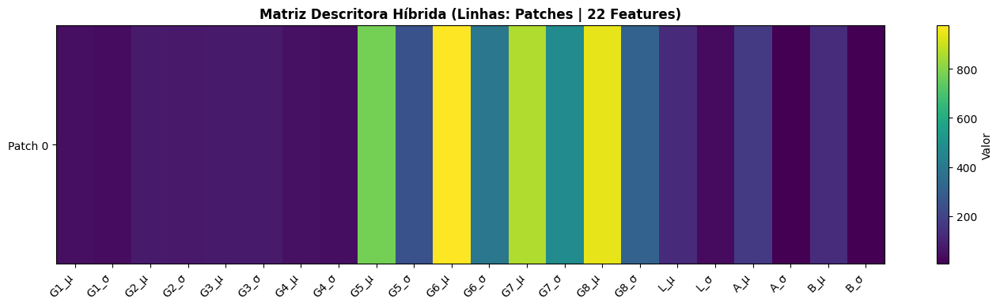

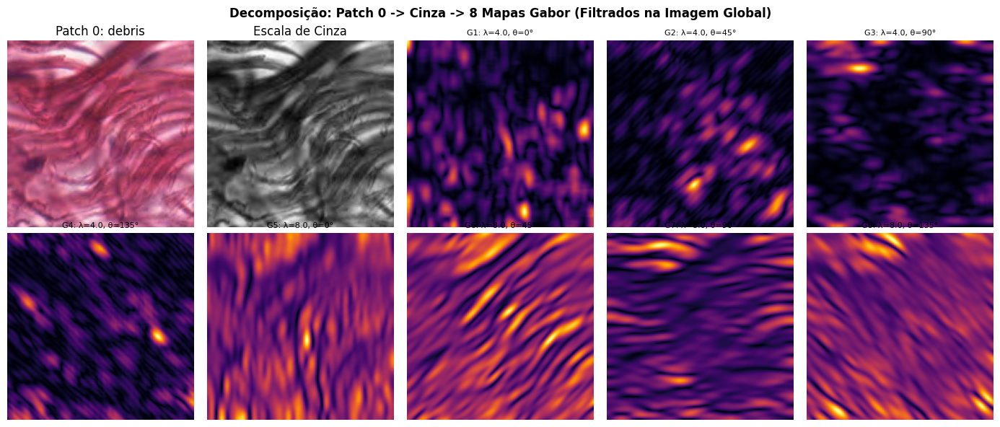

In [161]:
# --- 1. Carregando amostra e extraindo ---
sample_img, sample_lbl = next(iter(ds_train.take(1)))

feature_matrix, visual_info = extract_image_features_with_maps(
    sample_img, gabor_bank, patch_size=kernel_size
)

# --- 2. Grid Heatmap (N_patches x 22 Colunas) ---
col_labels = [f"G{i}_{s}" for i in range(1, 9) for s in ["μ", "σ"]] + [
    f"{c}_{s}" for c in ["L", "A", "B"] for s in ["μ", "σ"]
]

plt.figure(figsize=(14, max(4, len(visual_info) * 0.35)))
plt.imshow(feature_matrix, aspect="auto", cmap="viridis")
plt.colorbar(label="Valor")
plt.xticks(ticks=np.arange(22), labels=col_labels, rotation=45, ha="right")
plt.yticks(
    ticks=np.arange(len(visual_info)),
    labels=[f"Patch {i}" for i in range(len(visual_info))],
)
plt.title(
    "Matriz Descritora Híbrida (Linhas: Patches | 22 Features)",
    fontweight="bold",
)
plt.tight_layout()
plt.show()

# --- 3. Decomposição de um Patch Específico ---
target_idx = 0
target = visual_info[target_idx]
gabor_meta = locals().get(
    "gabor_meta", [f"Filtro {i+1}" for i in range(len(target.energy_maps))]
)
class_name = (
    class_names[sample_lbl.numpy()]
    if "class_names" in locals()
    else str(sample_lbl.numpy())
)

plt.figure(figsize=(14, 6))

plt.subplot(2, 5, 1)
plt.imshow(target.patch)
plt.title(f"Patch {target_idx}: {class_name}")
plt.axis("off")

plt.subplot(2, 5, 2)
plt.imshow(target.gray, cmap="gray")
plt.title("Escala de Cinza")
plt.axis("off")

for i, (emap, meta) in enumerate(zip(target.energy_maps[:8], gabor_meta[:8])):
    plt.subplot(2, 5, i + 3)
    plt.imshow(emap, cmap="inferno")
    plt.title(f"G{i+1}: {meta}", fontsize=8)
    plt.axis("off")

plt.suptitle(
    f"Decomposição: Patch {target_idx} -> Cinza -> 8 Mapas Gabor (Filtrados na Imagem Global)",
    fontweight="bold",
)
plt.tight_layout()
plt.show()

In [162]:
from tqdm import tqdm
print("Extraindo feições multimodais de Treino...")
X_train, y_train = [], []
for img, lbl in tqdm(ds_train):
    descritores = extract_image_features(img.numpy(), gabor_bank, patch_size=kernel_size)  # <- com patch_size
    for v in descritores:
        X_train.append(v)
        y_train.append(lbl.numpy())

X_train = np.array(X_train)
y_train = np.array(y_train)


print("Extraindo feições multimodais de Validação...")
X_val_by_img, y_val_by_img = [], []

for img, lbl in tqdm(ds_val):
    descritores = extract_image_features(img.numpy(), gabor_bank, patch_size=kernel_size)
    if len(descritores) > 0:
        X_val_by_img.append(descritores)        # Lista de arrays (N_patches_i, 22)
        y_val_by_img.append(int(lbl.numpy()))   # Rótulo escalar da imagem

# Apenas se quiser uma matriz plana para métricas globais por patch:
X_val_flat = np.vstack(X_val_by_img)
y_val_flat = np.repeat(y_val_by_img, [len(d) for d in X_val_by_img])

Extraindo feições multimodais de Treino...


100%|██████████| 4000/4000 [00:16<00:00, 236.61it/s]


Extraindo feições multimodais de Validação...


100%|██████████| 500/500 [00:02<00:00, 232.15it/s]


In [163]:
from polymahalanobis import PolyMahalanobis

os.makedirs("models_hybrid", exist_ok=True)
poly_models = {}
num_levels = 3

for cls_idx, cls_name in enumerate(class_names):
    samples = X_train[y_train == cls_idx]
    if len(samples) > 350:
        idx = np.random.choice(len(samples), size=350, replace=False)
        samples = samples[idx]

    sample_file = f"models_hybrid/samples_{cls_idx}.txt"
    np.savetxt(sample_file, samples, fmt="%.6f", delimiter=" ")

    model = PolyMahalanobis(sample_file, num_levels=num_levels)
    model.makeSpace()
    poly_models[cls_idx] = model
    print(f"Subespaço ajustado para [{cls_name}] ({len(samples)} amostras de treino).")

Subespaço ajustado para [tumor] (350 amostras de treino).
Subespaço ajustado para [stroma] (350 amostras de treino).
Subespaço ajustado para [complex] (350 amostras de treino).
Subespaço ajustado para [lympho] (350 amostras de treino).
Subespaço ajustado para [debris] (350 amostras de treino).
Subespaço ajustado para [mucosa] (350 amostras de treino).
Subespaço ajustado para [adipose] (350 amostras de treino).
Subespaço ajustado para [empty] (350 amostras de treino).


In [164]:
from typing import List, Tuple
import cv2
import matplotlib.pyplot as plt
import numpy as np


def distances_to_uint8(
    distances: np.ndarray, exp_value: float = -0.05
) -> np.ndarray:
    """Converte distâncias em similaridade [0, 255]."""
    gamma = -abs(exp_value)
    sim = np.clip(np.exp(gamma * distances), 0.0, 1.0)
    return np.rint(sim * 255.0).astype(np.uint8)


def evaluate_dense_grid(
    flat_feats: np.ndarray, poly_models: dict
) -> np.ndarray:
    """Avalia o array (5625, 22) para cada classe."""
    n_pixels = flat_feats.shape[0]
    num_classes = len(poly_models)
    dist_matrix = np.zeros((n_pixels, num_classes), dtype=np.float32)

    for c_idx, model in poly_models.items():
        res = np.asarray(model.evaluate(flat_feats))
        if res.ndim == 2:
            dist_matrix[:, c_idx] = res[:, -1]
        else:
            dist_matrix[:, c_idx] = res.flatten()

    return dist_matrix


def compute_dense_descriptors_75x75(
    img_bgr: np.ndarray, gabor_bank: list, win_size: Tuple[int, int] = (15, 15)
) -> np.ndarray:
    """Redimensiona para 75x75 fixo e extrai as 22 features locais (16 Gabor + 6 Lab)."""
    # 1. Trava tamanho estritamente em 75x75
    img_75 = cv2.resize(img_bgr, (75, 75))

    # 2. Espaço Lab (3 canais -> 6 features)
    lab = cv2.cvtColor(img_75, cv2.COLOR_BGR2LAB).astype(np.float32)

    # 3. Tons de cinza para o Banco Gabor
    gray = cv2.cvtColor(img_75, cv2.COLOR_BGR2GRAY).astype(np.float32)

    dense_feats = []

    # Mapas de energia Gabor (8 filtros -> 16 features)
    for kern in gabor_bank[:8]:
        # Suporta se o banco for lista de kernels OpenCV ou tuplas de parâmetros
        if isinstance(kern, np.ndarray):
            fimg = cv2.filter2D(gray, cv2.CV_32F, kern)
        else:
            fimg = cv2.filter2D(gray, cv2.CV_32F, kern[0])

        emap = np.abs(fimg)
        m = cv2.blur(emap, win_size)
        sq_m = cv2.blur(emap**2, win_size)
        s = np.sqrt(np.maximum(sq_m - m**2, 0.0))
        dense_feats.extend([m, s])

    # Estatísticas locais do Lab
    for c in range(3):
        ch = lab[:, :, c]
        m = cv2.blur(ch, win_size)
        sq_m = cv2.blur(ch**2, win_size)
        s = np.sqrt(np.maximum(sq_m - m**2, 0.0))
        dense_feats.extend([m, s])

    # Shape final: (75, 75, 22) -> (5625, 22)
    tensor_22d = np.stack(dense_feats, axis=-1)
    return tensor_22d.reshape(-1, 22)


def visualize_dense_similarity_maps(
    image_np: np.ndarray,
    poly_models: dict,
    class_names: List[str],
    true_label: int,
    gabor_bank: list,
    win_size: Tuple[int, int] = (15, 15),
    exp_value: float = -0.05,
    alpha: float = 0.55,
):
    if hasattr(image_np, "numpy"):
        image_np = image_np.numpy()

    # Normaliza imagem de entrada para uint8 RGB [0, 255]
    img_disp = (
        (image_np * 255).astype(np.uint8)
        if image_np.max() <= 1.0
        else image_np.astype(np.uint8)
    )
    orig_h, orig_w = img_disp.shape[:2]

    # Converte para BGR para as funções OpenCV
    img_bgr = cv2.cvtColor(img_disp, cv2.COLOR_RGB2BGR)

    # Extrai descritores na matriz fixa 75x75
    flat_22d = compute_dense_descriptors_75x75(
        img_bgr, gabor_bank, win_size=win_size
    )

    # Inferência dos 5625 vetores
    dist_matrix = evaluate_dense_grid(flat_22d, poly_models)

    # Votação majoritária dos pixels
    pixel_preds = np.argmin(dist_matrix, axis=1)
    classes, counts = np.unique(pixel_preds, return_counts=True)
    pred_class = int(classes[np.argmax(counts)])

    num_classes = len(poly_models)
    total_cols = 2 + num_classes
    fig, axes = plt.subplots(1, total_cols, figsize=(4.2 * total_cols, 4.5))

    is_correct = pred_class == true_label
    gt_name = class_names[true_label]
    pred_name = class_names[pred_class]

    # --- Coluna 0: Imagem Original ---
    axes[0].imshow(img_disp)
    axes[0].axis("off")
    title_color = "forestgreen" if is_correct else "crimson"
    axes[0].set_title(
        f"Pred: {pred_name}\nGT: {gt_name}",
        fontsize=11,
        fontweight="bold",
        color=title_color,
    )

    # --- Colunas 1 até N: Heatmaps 75x75 interpolados ---
    for c_idx, c_name in enumerate(class_names):
        ax = axes[1 + c_idx]
        dists_c = dist_matrix[:, c_idx]

        sim_uint8 = distances_to_uint8(dists_c, exp_value=exp_value)
        heat_grid = sim_uint8.reshape(75, 75)

        heat_full = cv2.resize(
            heat_grid, (orig_w, orig_h), interpolation=cv2.INTER_CUBIC
        )

        ax.imshow(img_disp)
        im = ax.imshow(
            heat_full, cmap="inferno", alpha=alpha, vmin=0, vmax=255
        )
        ax.set_title(f"Similaridade:\n{c_name}", fontsize=10)
        ax.axis("off")

        if c_idx == pred_class:
            border_color = "forestgreen" if is_correct else "crimson"
            ax.axis("on")
            for spine in ax.spines.values():
                spine.set_color(border_color)
                spine.set_linewidth(3.5)
            ax.set_xticks([])
            ax.set_yticks([])

        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    # --- Coluna Final: Atribuição por Região ---
    ax_last = axes[-1]
    decision_grid = pixel_preds.reshape(75, 75)
    decision_full = cv2.resize(
        decision_grid, (orig_w, orig_h), interpolation=cv2.INTER_NEAREST
    )

    cmap_disc = plt.get_cmap("tab10", num_classes)
    ax_last.imshow(img_disp)
    im_disc = ax_last.imshow(
        decision_full,
        cmap=cmap_disc,
        alpha=0.6,
        vmin=0,
        vmax=num_classes - 1,
    )
    ax_last.set_title("Vencedor por Região\n(75x75)", fontsize=10)
    ax_last.axis("off")

    fig.colorbar(
        im_disc,
        ax=ax_last,
        ticks=range(num_classes),
        fraction=0.046,
        pad=0.04,
    )

    plt.tight_layout()
    plt.show()

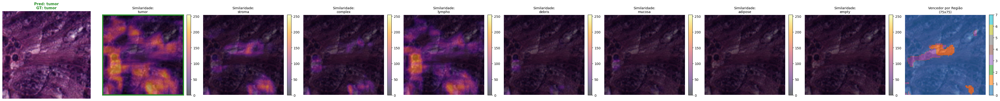

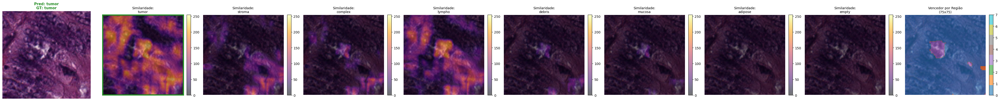

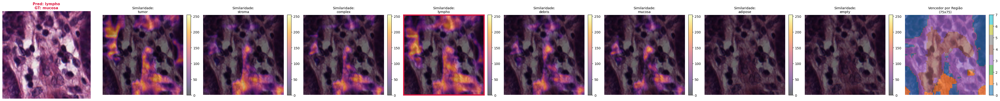

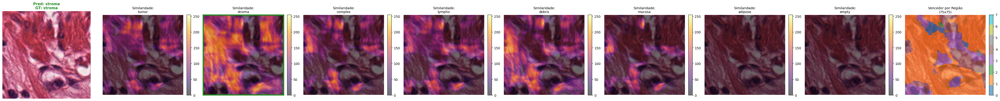

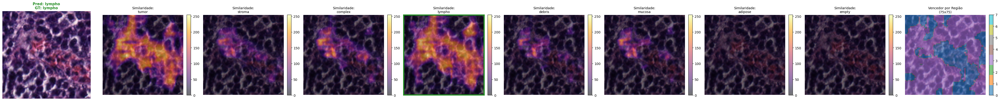

In [165]:
for idx, (val_img, val_lbl) in enumerate(ds_val.take(5)):
    visualize_dense_similarity_maps(
        image_np=val_img,
        poly_models=poly_models,
        class_names=class_names,
        true_label=int(val_lbl.numpy()),
        gabor_bank=gabor_bank,
        win_size=(15, 15),
        exp_value=-0.05,
    )

In [166]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

y_true = []
y_pred = []

print("Avaliando todo o conjunto de validação...")
for img, lbl in tqdm(ds_val):
    img_np = img.numpy()
    
    # Extrai descritores dos patches da imagem
    patch_feats = extract_image_features(img_np, gabor_bank, patch_size=kernel_size)
    if len(patch_feats) == 0:
        continue
    
    # Avalia os patches com os modelos PolyMahalanobis
    dist_matrix = evaluate_patches(patch_feats, poly_models)
    
    # Decide a classe final da imagem por votação majoritária dos patches
    pred_class, _ = predict_image(dist_matrix, method="voting")
    
    y_true.append(int(lbl.numpy()))
    y_pred.append(pred_class)

y_true = np.array(y_true)
y_pred = np.array(y_pred)

Avaliando todo o conjunto de validação...


100%|██████████| 500/500 [00:11<00:00, 42.72it/s]


In [167]:
# Gera o relatório em dicionário para transformar em DataFrame
report_dict = classification_report(
    y_true,
    y_pred,
    target_names=class_names,
    output_dict=True,
    zero_division=0
)

# Converte para DataFrame legível
df_metrics = pd.DataFrame(report_dict).transpose()
df_metrics = df_metrics.round(3)

# Exibe a tabela formatada
display(df_metrics)

,precision,recall,f1-score,support
tumor,0.755,0.889,0.816,45.000
stroma,0.740,0.826,0.781,69.000
complex,0.864,0.551,0.673,69.000
lympho,0.831,0.937,0.881,63.000
debris,0.696,0.948,0.803,58.000
mucosa,0.960,0.706,0.814,68.000
adipose,0.983,0.951,0.967,61.000
empty,0.985,0.985,0.985,67.000
accuracy,0.842,0.842,0.842,0.842
macro avg,0.852,0.849,0.840,500.000


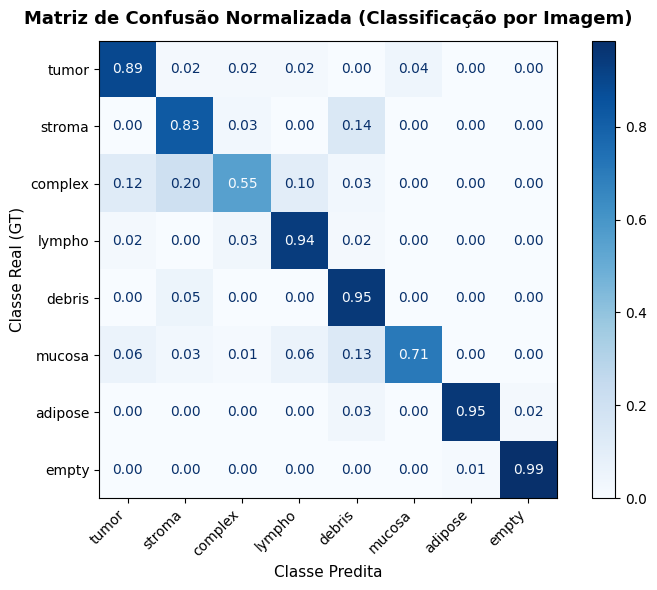

In [168]:
# Normaliza pelas linhas (Ground Truth), garantindo valores entre 0.0 e 1.0
cm = confusion_matrix(y_true, y_pred, labels=range(len(class_names)), normalize="true")

fig, ax = plt.subplots(figsize=(8, 6))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

# 'values_format=".2f"' exibe as proporções (ex: 0.85); use '".1%"' se preferir porcentagem
disp.plot(cmap="Blues", values_format=".2f", ax=ax, colorbar=True)

plt.title("Matriz de Confusão Normalizada (Classificação por Imagem)", fontsize=13, fontweight="bold", pad=12)
plt.xlabel("Classe Predita", fontsize=11)
plt.ylabel("Classe Real (GT)", fontsize=11)
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()